# Test the hologram performances with HD205905 data 05 juin 2017
==================================================================================================

- author : Sylvie
- date   : September 26th th 2017





#### problem because limitation in output of data

- firt I tried to generate a config file for jupyter

If you ran jupyter notebook --generate-config to create it, it should be in the correct place already. If not, try putting it at ~/.jupyter/jupyter_notebook_config.py

- and I set : 
> c.NotebookApp.iopub_data_rate_limit = 1000000

but it failed again so I launch jupyter as follow:

> jupyter notebook --NotebookApp.iopub_data_rate_limit=10000000 full_baseanalysis.ipynb 

So it behaves better

In [4]:
%%javascript
var kernel = IPython.notebook.kernel;
var thename = window.document.getElementById("notebook_name").innerHTML;
var command = "theNotebook = " + "'"+thename+"'";
kernel.execute(command);

<IPython.core.display.Javascript object>

In [5]:
%matplotlib inline
%load_ext autoreload
%autoreload 2

print theNotebook
from IPython.display import Image, display
import sys
sys.path.append("../../common_tools/")
from common_notebook import *

init_notebook()

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload
Ana2DShapeSpectra
ccdproc version 1.2.0
bottleneck version 1.2.1
/Users/dagoret/MacOSX/GitHub/LSST/CTIOAnaJun2017/CTIOAnaJun2017/ana_05jun17/HD205905


In [6]:
from astropy.modeling import models, fitting

In [7]:
import pandas as pd

# Input directory

In [8]:
#inputdir="../OverScanRemove/trim_images"
#inputdir="../../data/CTIODataJune2017_reducedRed/data_05jun17/"
inputdir="./rotated_fitsimages"
MIN_IMGNUMBER=46
MAX_IMGNUMBER=126
date="20170605"
object_name='HD205905'
tag = "rotimg"
SelectTagRe='^%s_%s_([0-9]+).fits$' % (tag,date) # regular expression to select the file
SearchTagRe='^%s_%s_[0-9]+.fits$' % (tag,date)
NBIMGPERROW=2

# Output directory

In [9]:
dir_top_images="images_notebooks/"+theNotebook ### Top directory to save images
ensure_dir(dir_top_images) # create that directory

outputdir="./spectrum_fitsspec"
ensure_dir(outputdir)

# Extract spectra
===================================

In [10]:
!ls *.csv

x_y_guess.csv   x_y_guess2.csv  xy_pointing.csv


In [11]:
df=pd.read_csv('xy_pointing.csv')
x_star=df["x_pointing"]
y_star=df["y_pointing"]
all_theta=df["theta"]
x_pointing=x_star
y_pointing=y_star

In [12]:
sorted_numbers,sorted_files = MakeFileList([inputdir],MIN_IMGNUMBER,MAX_IMGNUMBER,SelectTagRe,SearchTagRe) 
all_dates,all_airmass,all_images,all_titles,all_header,all_expo,all_filt=BuildImages(sorted_files,sorted_numbers,object_name)

print 'Number of images:',len(all_images)

Number of images: 80


In [13]:
order0_positions = np.array([x_pointing,y_pointing]).T

In [14]:
all_grat = []
for f in all_filt :
    #all_grat.append(f.replace('RG715 ',''))
    all_grat.append(f.replace('dia ',''))
for index,g in enumerate(all_grat):
    holo = Hologram(g,verbose=False)
    print g,holo.theta(order0_positions[index]), all_theta[index]

Thor300 -0.575 -0.47222993739
HoloPhP [-0.95819193] -0.964870623171
HoloPhAg [-1.84710595] -1.90434261369
HoloAmAg [-1.93380172] -1.41772612896
Thor300 -0.575 -0.47998432295
HoloPhP [-0.95927986] -0.97187531976
HoloPhAg [-1.89179692] -1.84119505992
HoloAmAg [-1.9417078] -1.44398056637
Thor300 -0.575 -0.453661565407
HoloPhP [-0.9685842] -0.956019095015
HoloPhAg [-1.89759634] -1.82139130488
HoloAmAg [-1.95013034] -1.45454768332
Thor300 -0.575 -0.44472615403
HoloPhP [-0.97365622] -0.992763495364
HoloPhAg [-1.89342904] -1.83079676226
HoloAmAg [-1.95422893] -1.47341061551
Thor300 -0.575 -0.473608450208
HoloPhP [-0.9671807] -0.969183774679
HoloPhAg [-1.8956152] -1.85393017859
HoloAmAg [-1.95944656] -1.46723087792
Thor300 -0.575 -0.450804274729
HoloPhP [-0.98023121] -0.958609774212
HoloPhAg [-1.88159777] -1.93345768804
HoloAmAg [-1.96562861] -1.50089885114
Thor300 -0.575 -0.467014533692
HoloPhP [-0.97496947] -0.984344681348
HoloPhAg [-1.89774663] -1.8888925923
HoloAmAg [-1.97260301] -1.460025

In [15]:
filt_names= [ 'dia Thor300', 'dia HoloPhP', 'dia HoloPhAg', 'dia HoloAmAg', 'Unknown']

In [16]:
def get_filt_idx(listoffilt):
    filt1_idx=[]
    filt2_idx=[]
    filt3_idx=[]
    filt4_idx=[]
    filt5_idx=[]
    index=0
    for filt in listoffilt:
        if filt == 'dia Thor300':
            filt1_idx.append(index)
        elif filt == 'dia HoloPhP':
            filt2_idx.append(index)
        elif filt == 'dia HoloPhAg':
            filt3_idx.append(index)
        elif filt == 'dia HoloAmAg':
            filt4_idx.append(index)
        else :
            filt5_idx.append(index)
    
        index+=1
    
    filt1_idx=np.array(filt1_idx)
    filt2_idx=np.array(filt2_idx)
    filt3_idx=np.array(filt3_idx)
    filt4_idx=np.array(filt4_idx)
    filt5_idx=np.array(filt5_idx)
    
    return filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx

In [17]:
filt1_idx,filt2_idx,filt3_idx,filt4_idx,filt5_idx=get_filt_idx(all_filt)

In [18]:
print filt1_idx
print filt2_idx
print filt3_idx
print filt4_idx
print filt5_idx

[ 0  4  8 12 16 20 24 28 32 36 40 44 48 52 55 59 63 67 71 75 79]
[ 1  5  9 13 17 21 25 29 33 37 41 45 49 56 60 64 68 72 76]
[ 2  6 10 14 18 22 26 30 34 38 42 46 50 53 57 61 65 69 73 77]
[ 3  7 11 15 19 23 27 31 35 39 43 47 51 54 58 62 66 70 74 78]
[]


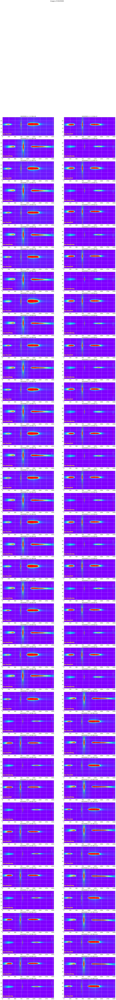

In [19]:
ShowImages(all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)

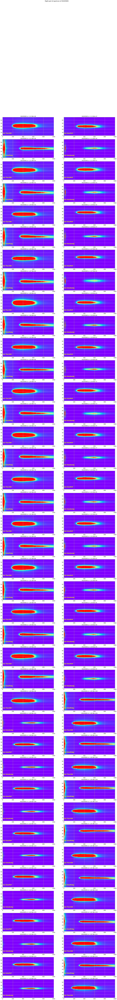

In [20]:
# Right spectrum
y_star=[60]*len(all_images)

ShowCenterImages([1300]*len(all_images),y_star,[500]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
title='Right part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'rightorder.pdf')
plt.savefig(figfilename)  

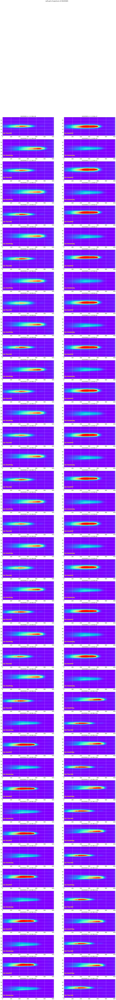

In [21]:
# Left spectrum
ShowCenterImages([110]*len(all_images),[60]*len(all_images),[500]*len(all_images),[30]*len(all_images),
                 all_images,all_titles,all_filt,object_name,NBIMGPERROW=2,vmin=0,vmax=10000)
title='Left part of spectrum of {} '.format(object_name)
plt.suptitle(title,size=16)
figfilename=os.path.join(dir_top_images,'leftorder.pdf')
plt.savefig(figfilename)  

# Plot one contour

In [23]:
def ShowOneContour(index,all_images,all_titles,thex0,object_name,all_expo,dir_top_img,all_filt,figname):

    plt.figure(figsize=(15,6))
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    x0=int(x_pointing[index])
    y0=30

    figfilename=os.path.join(dir_top_img,figname)   
        
    full_image=np.copy(all_images[index])
    yprofile=np.sum(full_image[:,spec_index_min:spec_index_max],axis=1)
    y0=np.where(yprofile==yprofile.max())[0][0]

    reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]/all_expo[index] 
           
    X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))  
        
    T=np.transpose(reduc_image)
        
        #im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=themax*0.5)    # pcolormesh is impracticalble in pdf file 
    plt.contourf(X, Y, reduc_image, 10, alpha=.75, cmap='jet',origin='lower')
    C = plt.contour(X, Y, reduc_image , 10, colors='black', linewidth=.5,origin='lower')
        
            
    plt.axis([X.min(), X.max(), Y.min(), Y.max()]); plt.grid(True)
    plt.title(all_titles[index])
    
    plt.grid(color='white', ls='solid')
    plt.text(700,15.,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
    plt.ylim(10.,30.)
    plt.savefig(figfilename)


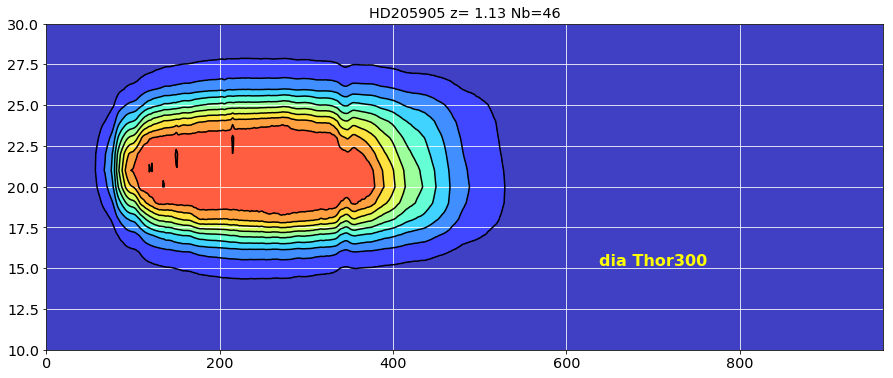

In [24]:
sel=0
ShowOneContour(sel,all_images,all_titles,x_pointing,object_name,all_expo,dir_top_images,all_filt,'contour_thor300.pdf')

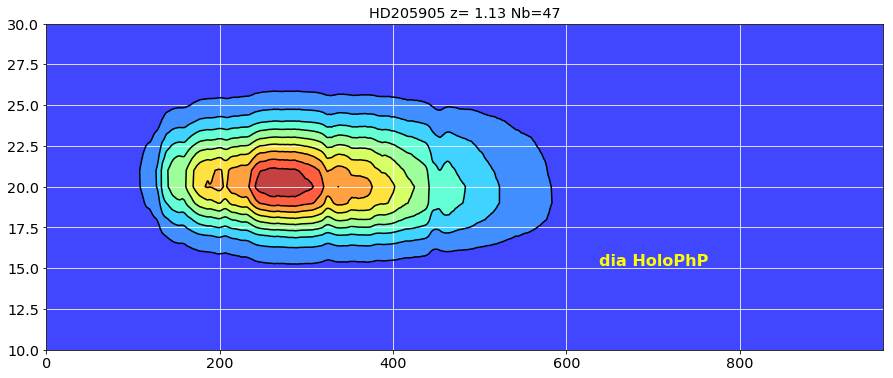

In [25]:
sel=1
ShowOneContour(sel,all_images,all_titles,x_pointing,object_name,all_expo,dir_top_images,all_filt,'contour_holo_php.pdf')

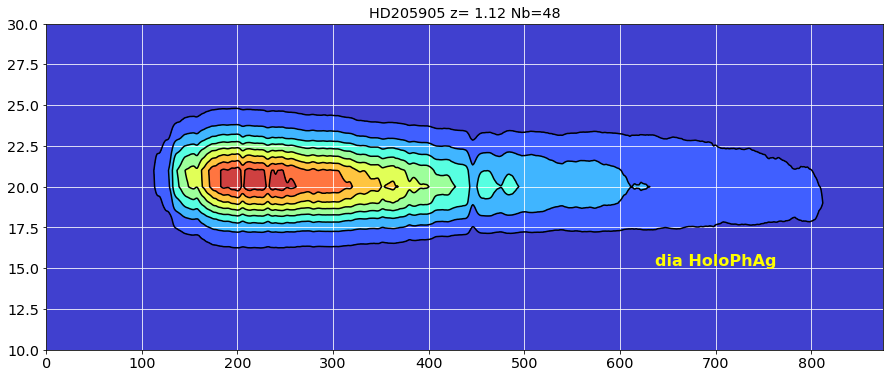

In [26]:
sel=2
ShowOneContour(sel,all_images,all_titles,x_pointing,object_name,all_expo,dir_top_images,all_filt,'contour_holophag.pdf')

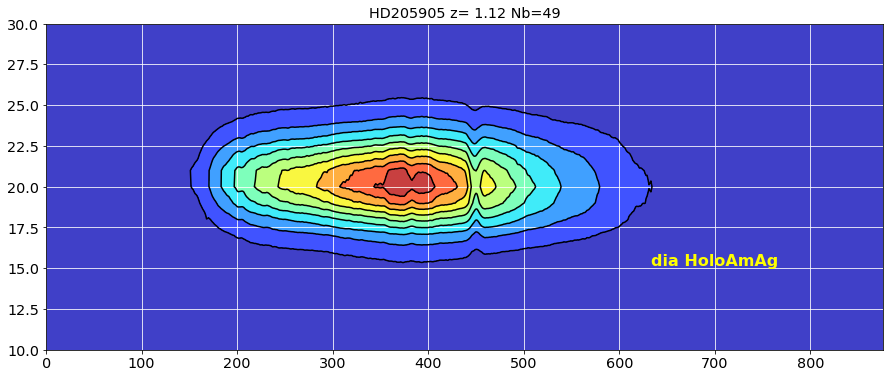

In [33]:
sel=3
ShowOneContour(sel,all_images,all_titles,x_pointing,object_name,all_expo,dir_top_images,all_filt,'contour_holoamag.pdf')

In [28]:
import numpy as np
import matplotlib.pyplot as plt
import os
import math as m

from matplotlib.backends.backend_pdf import PdfPages   



def ShowOneOrder_contour(all_images,all_titles,thex0,object_name,all_expo,dir_top_img,all_filt,figname):
    """
    ShowRawImages_contour: Show the raw images without background subtraction
    ==============
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,m.ceil(NBIMAGES/NBIMGPERROW))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    
    
    figfilename=os.path.join(dir_top_img,figname)   
    title='Images of {}'.format(object_name)
    
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    figfilename=os.path.join(dir_top_img,figname)
    pp = PdfPages(figfilename) # create a pdf file
    
    
    for index in np.arange(0,NBIMAGES):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
                
        
        full_image=np.copy(all_images[index])
        
        yprofile=np.sum(full_image[:,spec_index_min:spec_index_max],axis=1)
        y0=np.where(yprofile==yprofile.max())[0][0]
        x0=int(thex0[index])
        
      
        
        if(all_expo[index]<=0 ): #special case of the first image
            reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]  
        else:
            reduc_image=full_image[y0-20:y0+20,x0+200:spec_index_max]/all_expo[index] 
            
        themax=reduc_image.flatten().max()    
            
        X,Y=np.meshgrid(np.arange(0,reduc_image.shape[1]),np.arange(reduc_image.shape[0]))  
        
        T=np.transpose(reduc_image)
        
        #im = axarr[iy,ix].pcolormesh(X,Y,reduc_image, cmap='rainbow',vmin=0,vmax=themax*0.5)    # pcolormesh is impracticalble in pdf file 
        axarr[iy,ix].contourf(X, Y, reduc_image, 10, alpha=.75, cmap='jet')
        C = axarr[iy,ix].contour(X, Y, reduc_image , 10, colors='black', linewidth=.5)
        
            
        axarr[iy,ix].axis([X.min(), X.max(), Y.min(), Y.max()]); axarr[iy,ix].grid(True)
        axarr[iy,ix].set_title(all_titles[index])
    
        axarr[iy,ix].grid(color='white', ls='solid')
        axarr[iy,ix].text(700,10.,all_filt[index],verticalalignment='bottom', horizontalalignment='center',color='yellow', fontweight='bold',fontsize=16)
        axarr[iy,ix].set_ylim(10.,30.)
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            print "pdf Page written ",PageNum
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    print "Final pdf Page written ",PageNum
    f.show()
    pp.close()  

pdf Page written  1


/Users/dagoret/anaconda/lib/python2.7/site-packages/matplotlib/figure.py:403: UserWarning: matplotlib is currently using a non-GUI backend, so cannot show the figure
  "matplotlib is currently using a non-GUI backend, "


pdf Page written  2
pdf Page written  3
pdf Page written  4
pdf Page written  5
pdf Page written  6
pdf Page written  7
pdf Page written  8
Final pdf Page written  8


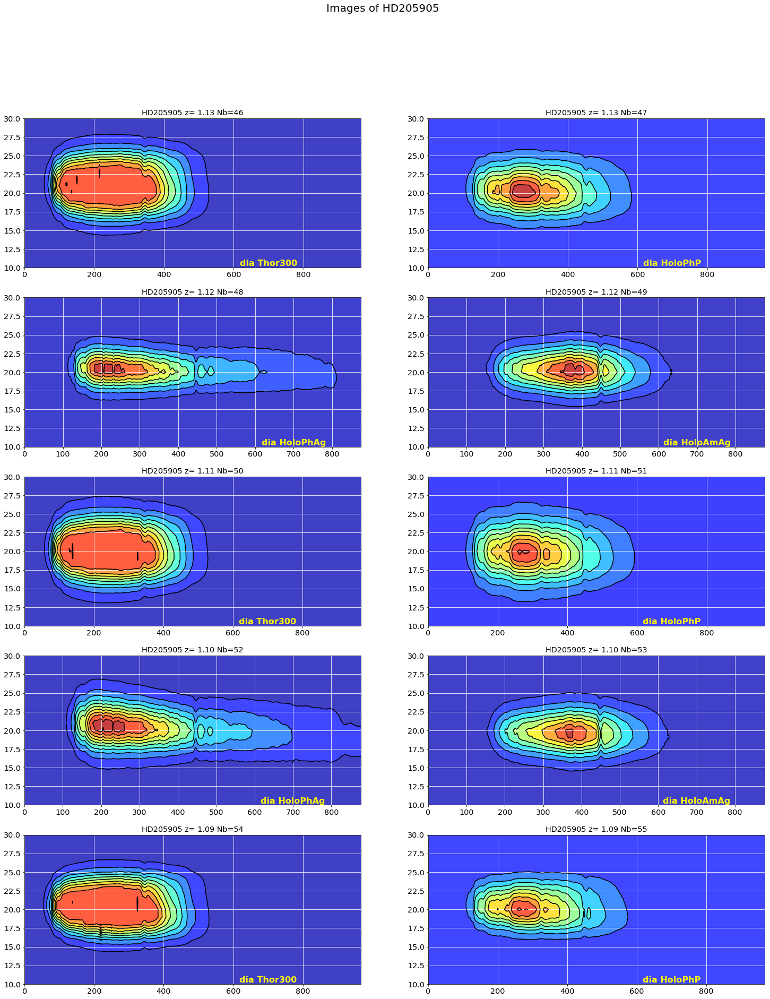

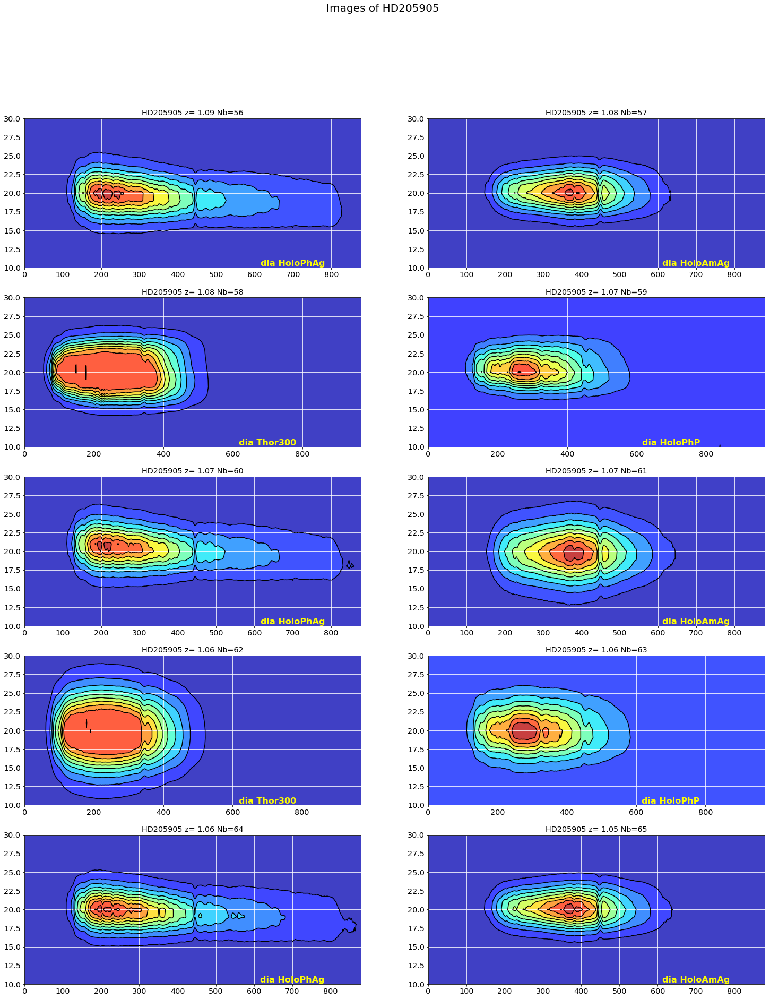

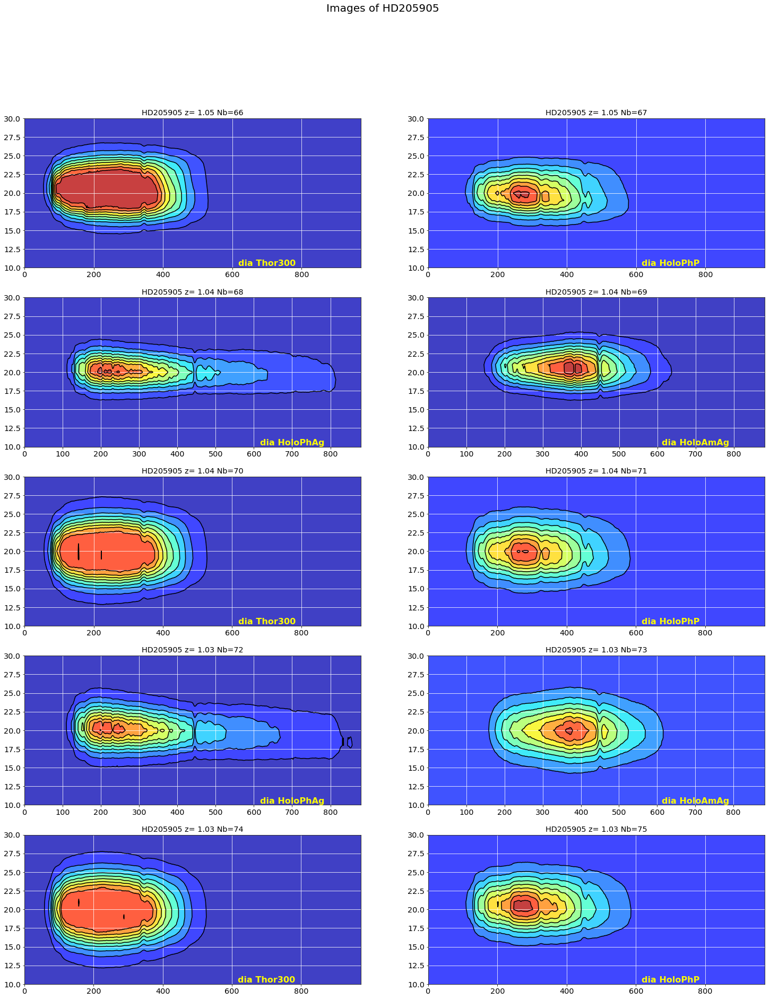

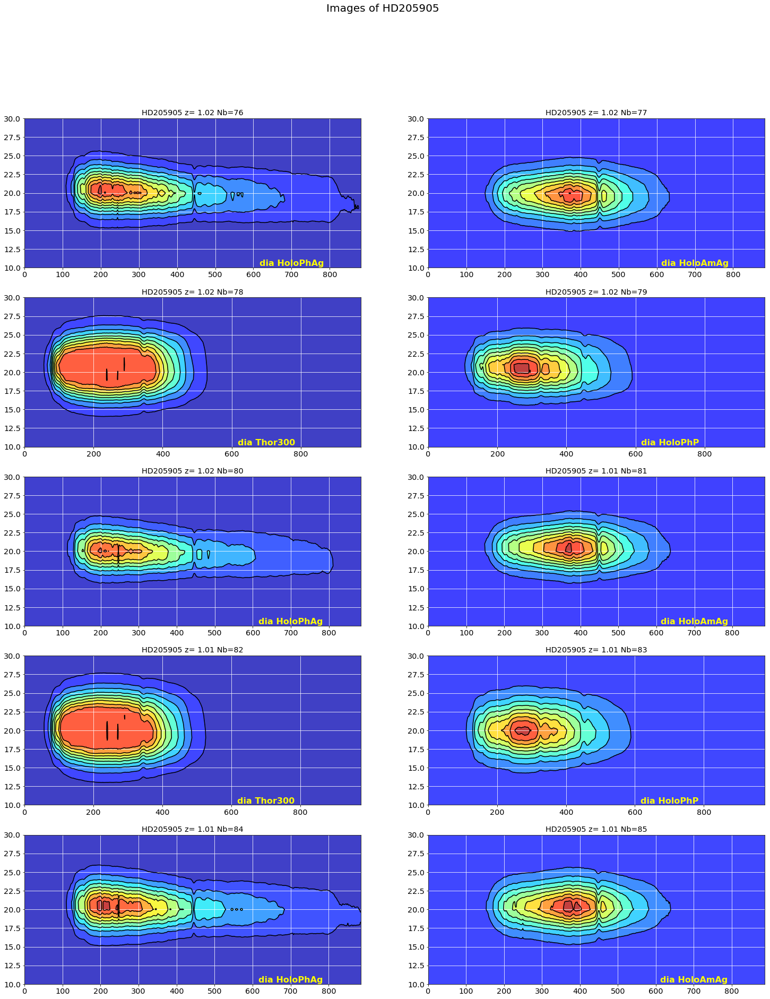

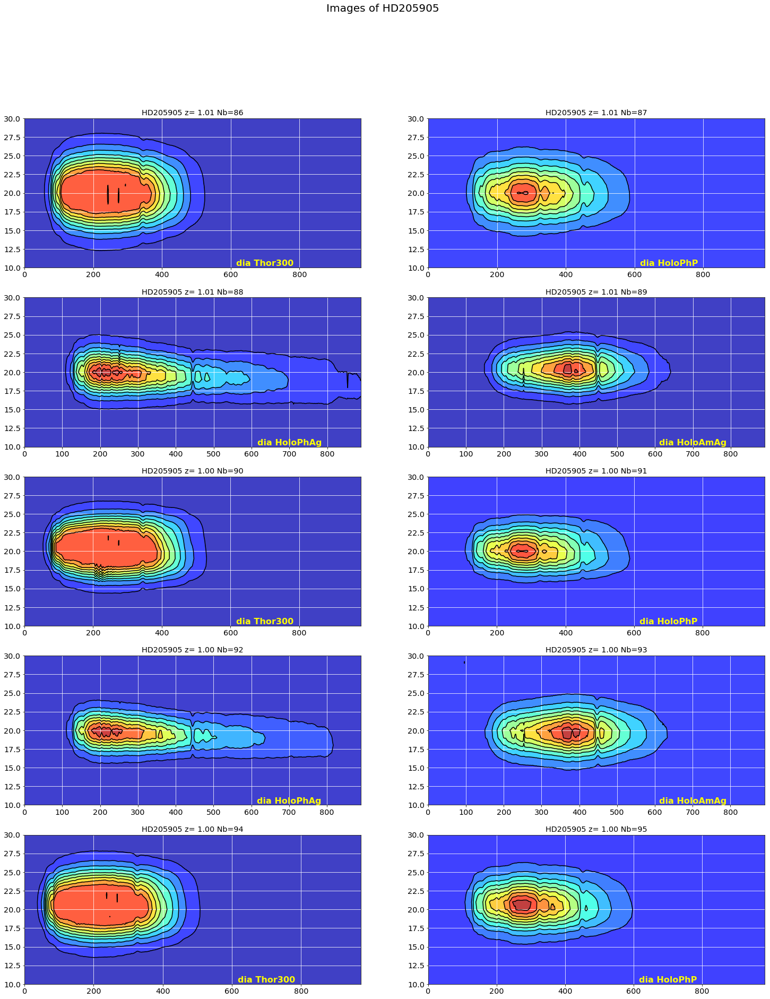

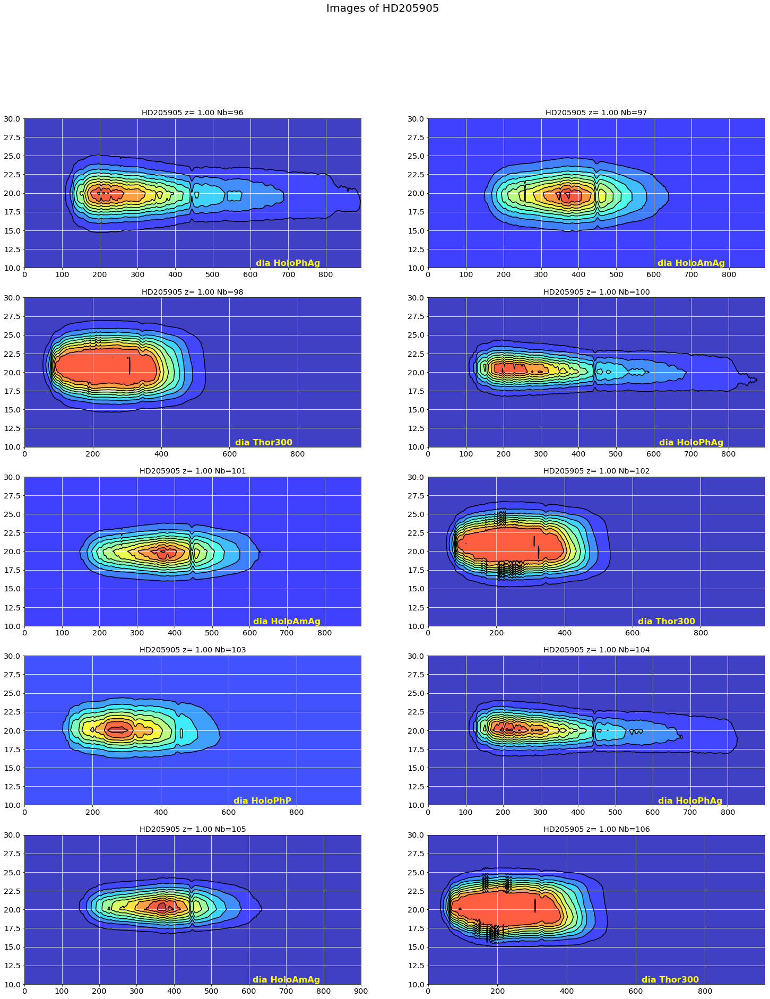

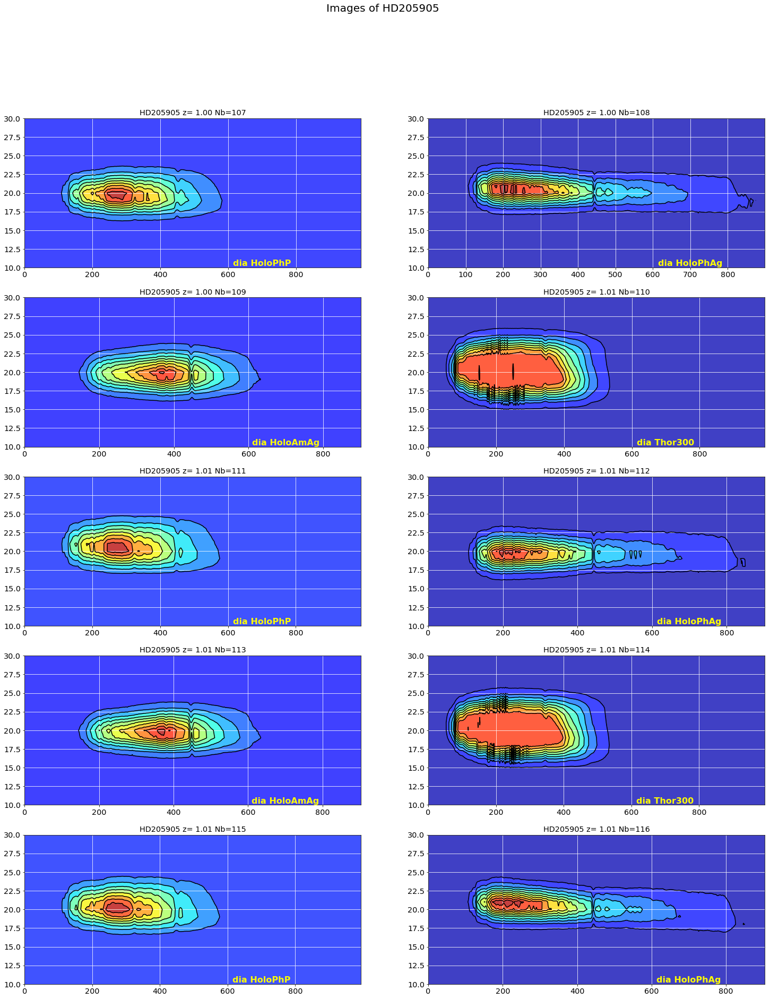

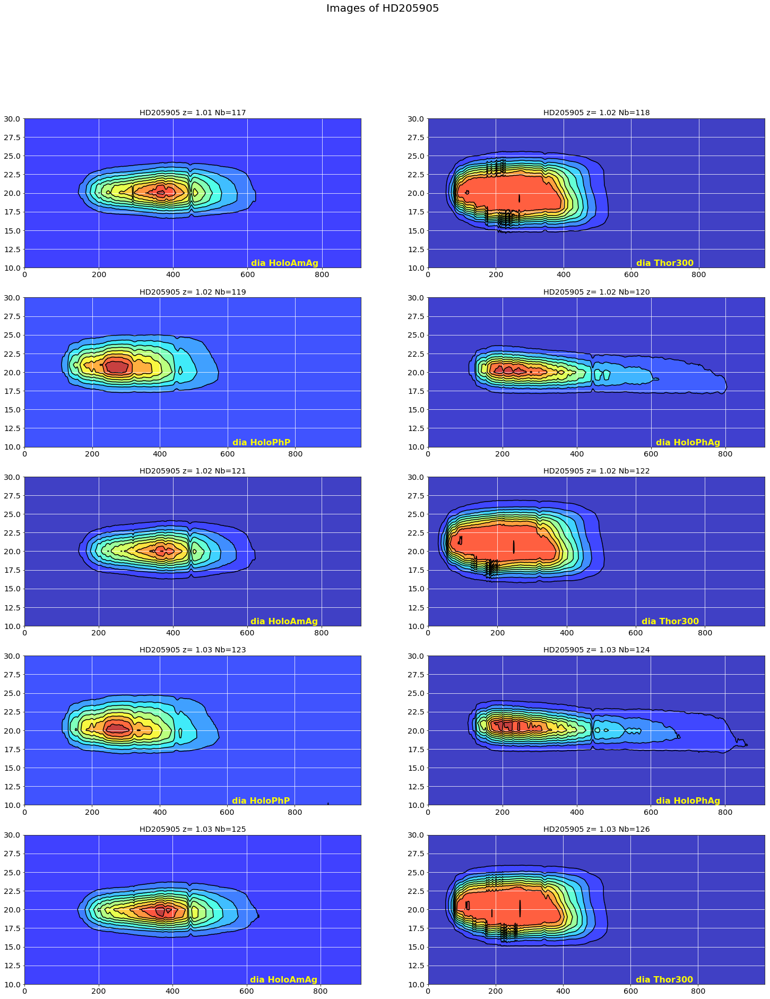

In [29]:
ShowOneOrder_contour(all_images,all_titles,x_pointing,object_name,all_expo,dir_top_images,all_filt,'firstorderright_contour.pdf')

In [30]:
import numpy as np
import matplotlib.pyplot as plt
import os

import math as m

from matplotlib.backends.backend_pdf import PdfPages 


def ShowTransverseProfile(all_images,thex0,all_titles,object_name,all_expo,dir_top_img,NBIMGPERROW=2):
    """
    ShowTransverseProfile: Show the raw images without background subtraction
    =====================
    The goal is to see in y, where is the spectrum maximum. Returns they0
    
    """
    NBIMGPERROW=2
    NBIMAGES=len(all_images)
    MAXIMGROW=max(2,m.ceil(NBIMAGES/NBIMGPERROW))
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70  
    
    
    title='Spectrum tranverse profile '.format(object_name)
    
     # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    
    
    figfilename=os.path.join(dir_top_img,'transverse_profile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    
    

    ############       Criteria for spectrum region selection #####################
    DeltaX=1000
    w=10
    ws=80
    Dist=4*w
    right_edge = 1800
    ##############################################################################
    
    # containers
    thespectra= []
    thespectraUp=[]
    thespectraDown=[]
    
    they0 = []  # container for the y value
    
    # loop on images
    #-----------------
    for index in np.arange(0,NBIMAGES):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        
        data=np.copy(all_images[index])[:,0:right_edge]
        
        x0=int(thex0[index])

        # Do not erase central star please
        data[:,x0-100:x0+100]=0 ## TURN OFF CENTRAL STAR
        
        if(all_expo[index]<=0):            
            yprofile=np.sum(data,axis=1)
        else:
            yprofile=np.sum(data,axis=1)/all_expo[index]
            
            
        ymin=1
        ymax=yprofile.max()
        y0=np.where(yprofile==ymax)[0][0]
        they0.append(y0)
        
        
        
        #y0 = they0[index]
        #im=axarr[iy,ix].imshow(data,vmin=-10,vmax=50)
        axarr[iy,ix].semilogy(yprofile)
        axarr[iy,ix].semilogy([y0,y0],[ymin,ymax],'r-')
        axarr[iy,ix].semilogy([y0-w,y0-w],[ymin,ymax],'k-')
        axarr[iy,ix].semilogy([y0+w,y0+w],[ymin,ymax],'k-')
        
        ##########################################################
        #### Here extract the spectrum around the central star
        #####   Take the sum un bins along y
        #############################################################
        
        spectrum2D=np.copy(data[y0-w:y0+w,:])
        xprofile=np.sum(spectrum2D,axis=0)

        
        ### Lateral bands to remove sky background
        ### ---------------------------------------
        spectrum2DUp=np.copy(data[y0-w+Dist:y0+w+Dist,:])
        xprofileUp=np.median(spectrum2DUp,axis=0)*2.*float(w)

        spectrum2DDown=np.copy(data[y0-w-Dist:y0+w-Dist,:])
        xprofileDown=np.median(spectrum2DDown,axis=0)*2.*float(w)
        
        
        if(all_expo[index]<=0):
            thespectra.append(xprofile)
            thespectraUp.append(xprofileUp)
            thespectraDown.append(xprofileDown)
        else:  ################## HERE I NORMALISE WITH EXPO TIME ####################################
            thespectra.append(xprofile/all_expo[index])
            thespectraUp.append(xprofileUp/all_expo[index]) 
            thespectraDown.append(xprofileDown/all_expo[index]) 

        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
    
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
          
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()
  
    
    return thespectra,thespectraUp,thespectraDown,they0

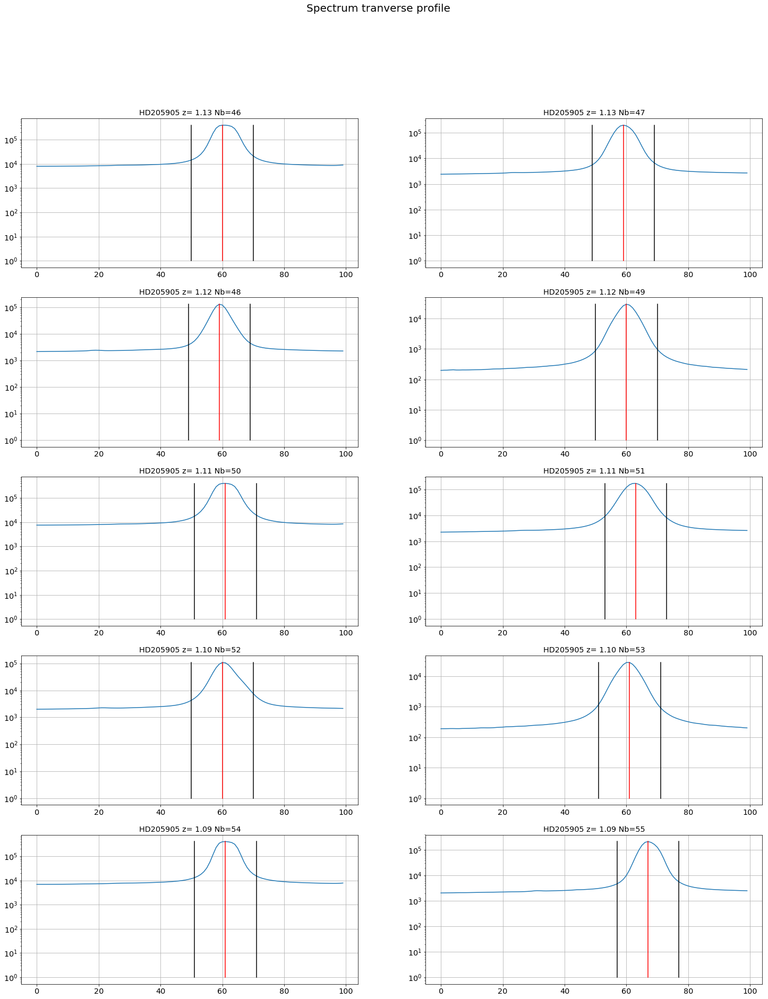

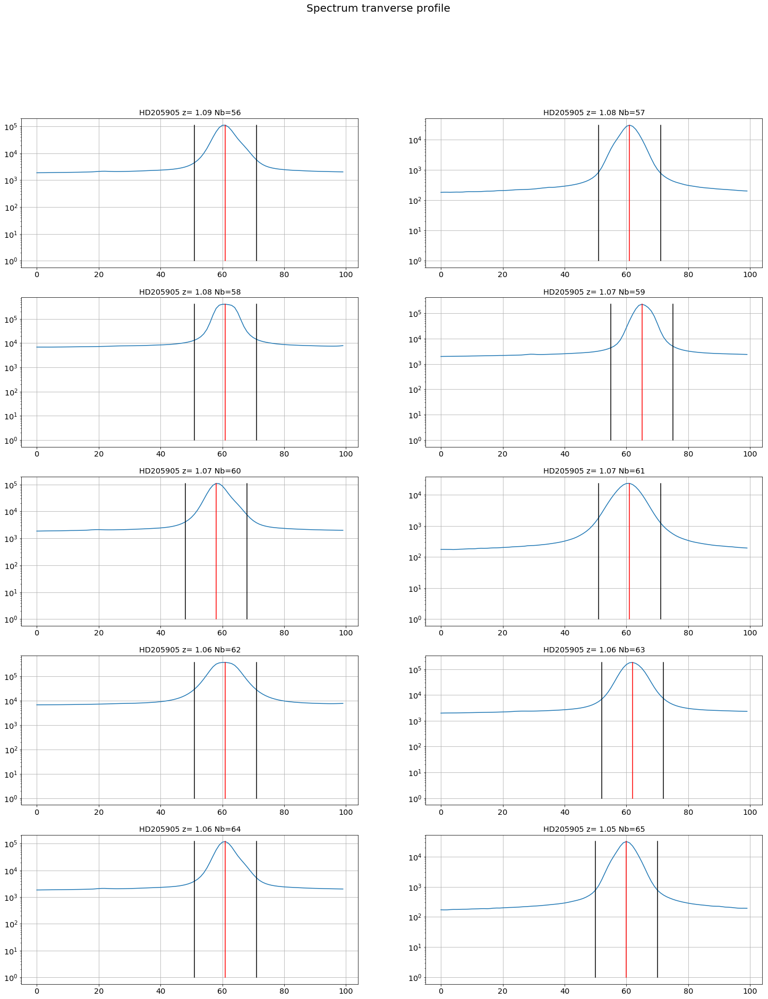

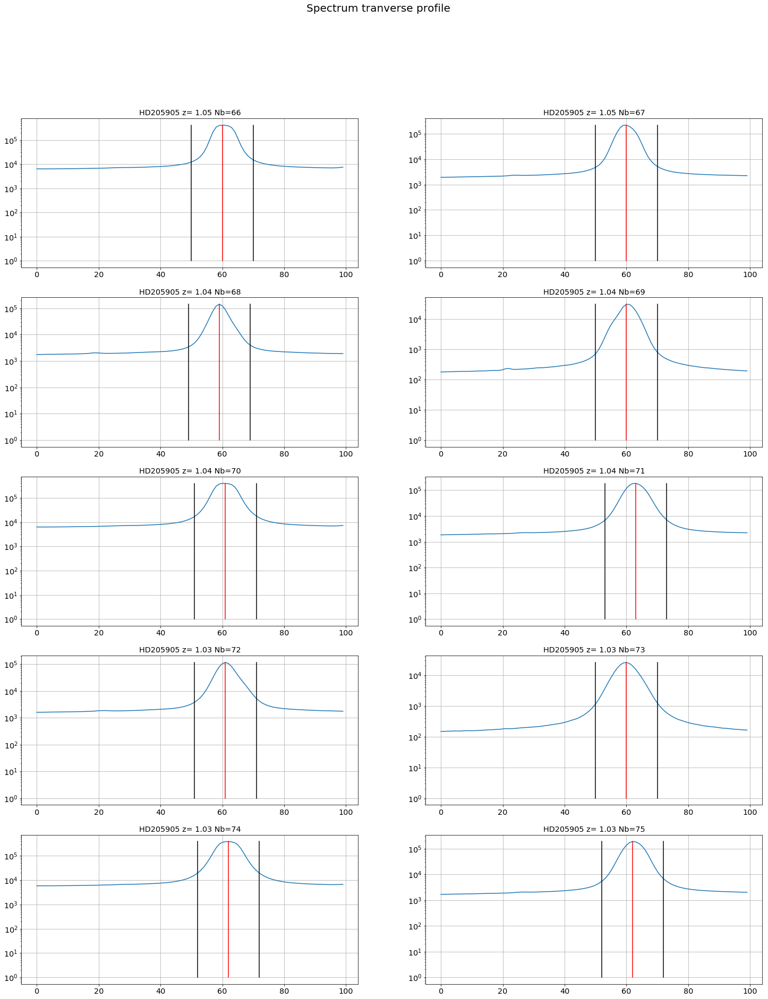

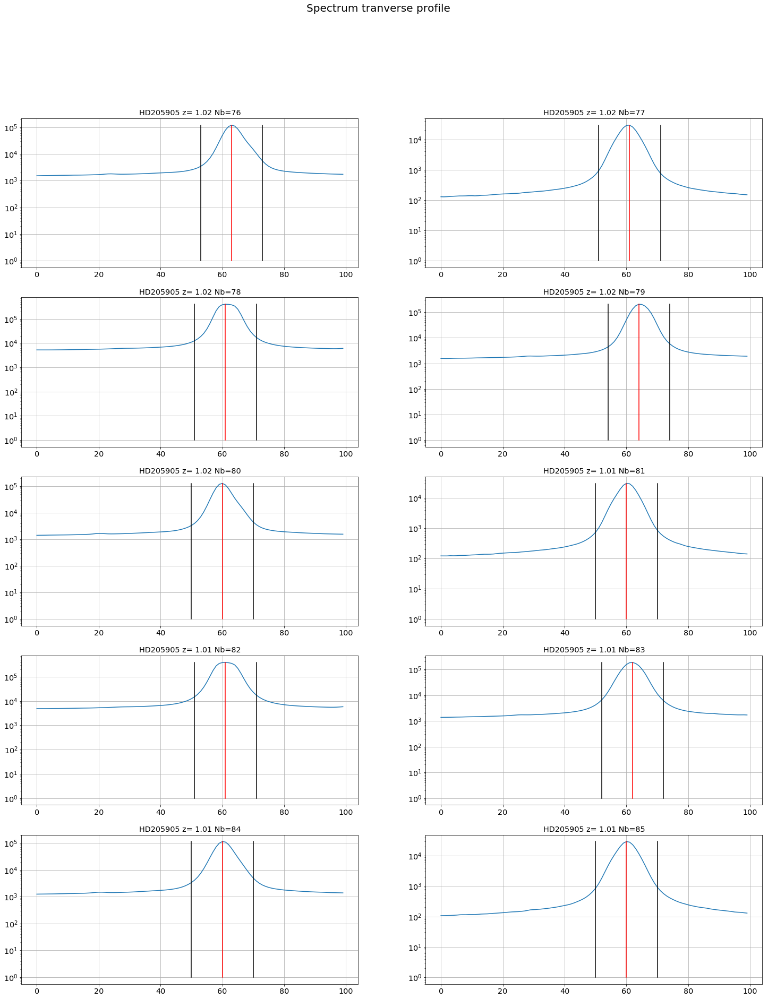

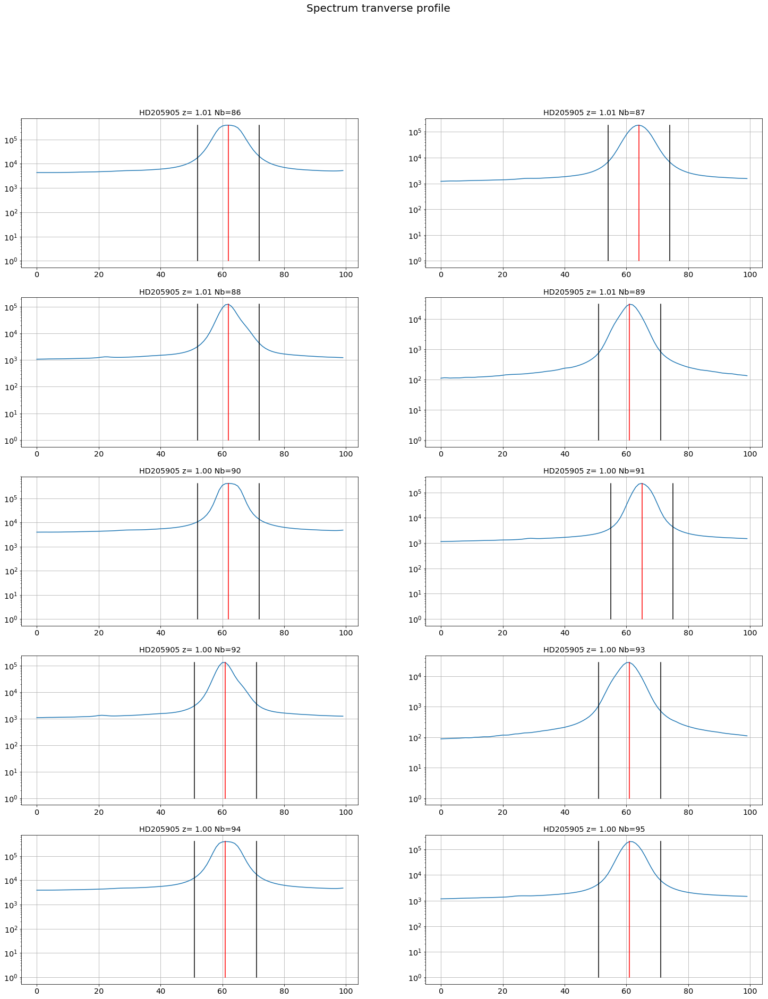

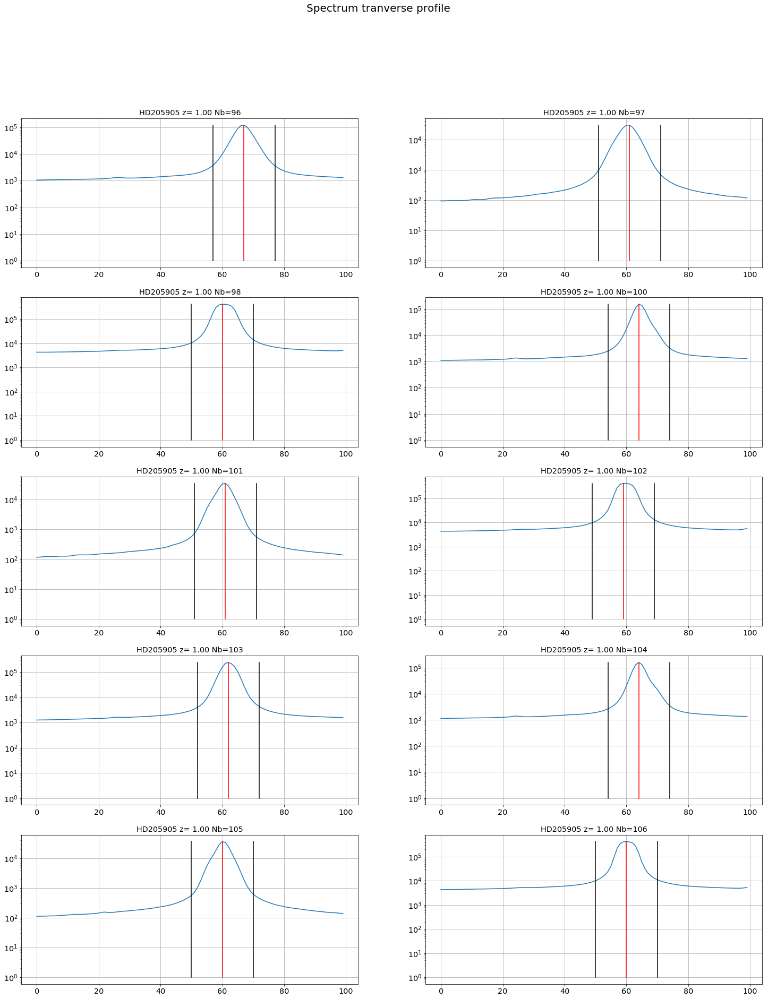

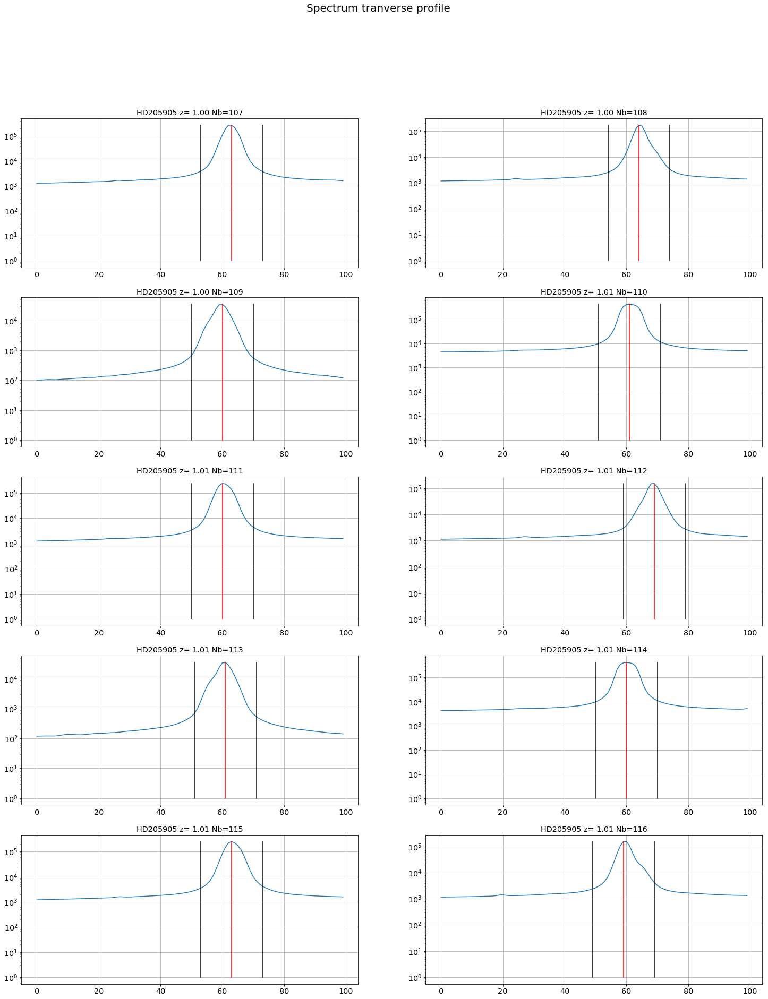

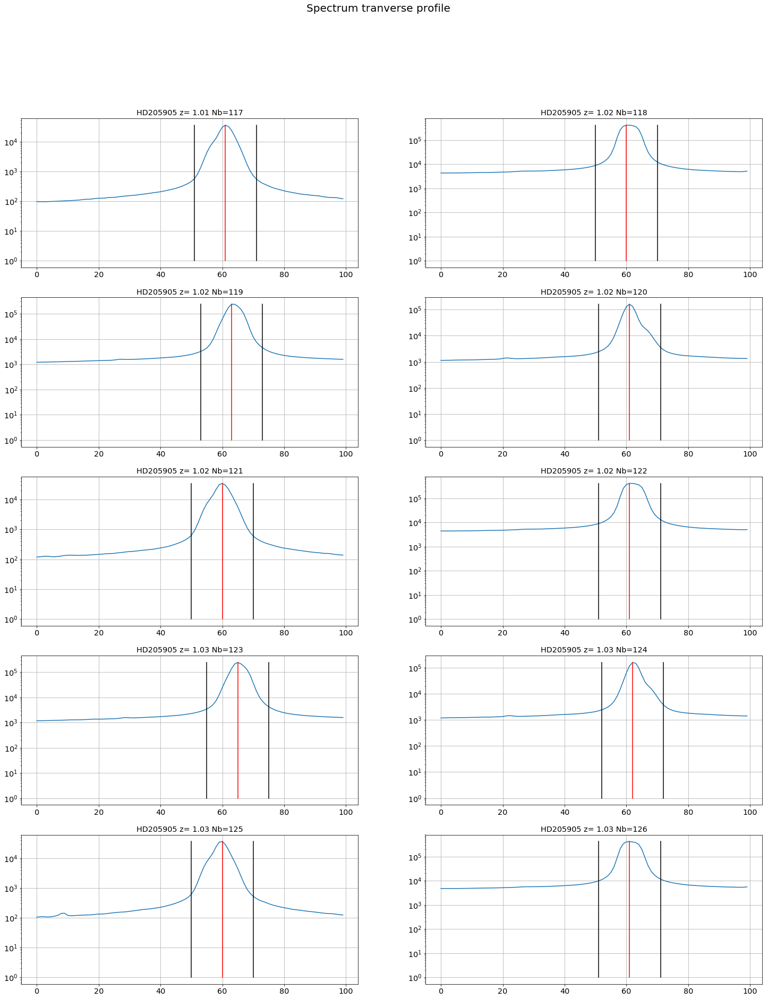

In [31]:
thespectra,thespectraUp,thespectraDown,they0=ShowTransverseProfile(all_images,x_pointing,all_titles,object_name,all_expo,dir_top_images)

# Extraction of the spectrum from the 2D - Images


### Check the transverse spectrum does not show multi-bum

This proves the rotation may be OK

In [ ]:
ShowTransverseProfile(all_images,all_titles,object_name,all_expo,NBIMGPERROW=2,
                      DeltaX=1000,w=3,ws=[10,20],right_edge=1800,ylim=(1e2,2e7))

## Extract the longitudinal spectrum with its lateral bands

In [ ]:
thespectra,thespectraUp,thespectraDown=ExtractSpectra(y_star,all_images,all_titles,object_name,all_expo,
                                                      w=3,ws=[10,30],right_edge=1800)

In [ ]:
sel=7

plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(thespectraUp[sel],'b-') 
plt.plot(thespectraDown[sel],'g-')
#plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,1500.)
figfilename=os.path.join(dir_top_images,'bckg_sample.pdf')
plt.savefig(figfilename) 

In [ ]:
thespectraAv=np.array(thespectraUp+thespectraDown)/2.


In [ ]:
ShowLongitBackground(thespectra,thespectraUp,thespectraDown,thespectraAv,all_titles,all_filt,object_name,
                     NBIMGPERROW=2,right_edge=1800)

In [ ]:
import math as m
from matplotlib.backends.backend_pdf import PdfPages
def ShowFullLongitBackground(spectra,spectraUp,spectraDown,spectraAv,all_titles,object_name,NBIMGPERROW,dir_top_images):
    """
    Show the background to be removed to the spectrum
    
    Implemented to write in a pdf file
    
    """
    NBSPEC=len(spectra)
    MAXIMGROW=max(2,m.ceil(NBSPEC/NBIMGPERROW))
    
    # fig file specif
    NBIMGROWPERPAGE=5  # number of rows per pages
    PageNum=0          # page counter
    figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
    pp = PdfPages(figfilename) # create a pdf file
    
    title='Longitudinal background Up/Down'.format(object_name)
    
    
    spec_index_min=100  # cut the left border
    spec_index_max=1900 # cut the right border
    star_halfwidth=70
    
    for index in np.arange(0,NBSPEC):
        
        
        if index%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            f, axarr = plt.subplots(NBIMGROWPERPAGE,NBIMGPERROW,figsize=(25,30))
            f.suptitle(title,size=20)
            
        # index of image in the page    
        indexcut=index-PageNum*(NBIMGROWPERPAGE*NBIMGPERROW)    
        ix=indexcut%NBIMGPERROW
        iy=indexcut/NBIMGPERROW
        
        # plot what is wanted
        axarr[iy,ix].plot(spectra[index],'r-')
        axarr[iy,ix].plot(spectraUp[index],'b-')
        axarr[iy,ix].plot(spectraDown[index],'g-')
        axarr[iy,ix].plot(spectraAv[index],'m-')
        axarr[iy,ix].set_title(all_titles[index])
        axarr[iy,ix].grid(True)
        
        star_pos=np.where(spectra[index][:spec_index_max]==spectra[index][:spec_index_max].max())[0][0]
        max_y_to_plot=(spectra[index][star_pos+star_halfwidth:spec_index_max]).max()*1.2
        
        
        axarr[iy,ix].set_ylim(0.,max_y_to_plot)
        axarr[iy,ix].text(spec_index_min,max_y_to_plot*1.1/1.2, all_filt[index],verticalalignment='top', horizontalalignment='center',color='blue',fontweight='bold', fontsize=20)
        
        
        # save a new page
        if (index+1)%(NBIMGPERROW*NBIMGROWPERPAGE) == 0:
            PageNum+=1  # increase page Number
            f.savefig(pp, format='pdf')
            f.show()
        
        
    
    
    f.savefig(pp, format='pdf') 
    f.show()
    pp.close()

In [ ]:
ShowFullLongitBackground(thespectra,thespectraUp,thespectraDown,thespectraAv,all_titles,object_name,2,dir_top_images)

In [ ]:
ShowLongitBackground(thespectra,thespectraUp,thespectraDown,thespectraAv,all_titles,all_filt,object_name,
                     NBIMGPERROW=2,right_edge=1)

In [ ]:
ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,object_name,dir_top_images)

## If OK then cleaning

In [ ]:
Clean_Up, Clean_Do,Clean_Av=CleanBadPixels(thespectraUp,thespectraDown) 

In [ ]:
ShowLongitBackground(thespectra,Clean_Up,Clean_Do,Clean_Av,all_titles,all_filt,object_name,
                     NBIMGPERROW=2,right_edge=1800)
figfilename=os.path.join(dir_top_images,'background_longprofile.pdf')
plt.savefig(figfilename)   

In [ ]:
sel=3
plt.figure(figsize=(18,8))
plt.plot(thespectra[sel],'r-') 
plt.plot(Clean_Up[sel],'b-') 
plt.plot(Clean_Do[sel],'g-')
plt.plot(Clean_Av[sel],'m-')
plt.grid(True)
plt.ylim(0,100.)

In [ ]:
thecorrspectra=CorrectSpectrumFromBackground(thespectra,Clean_Av)

ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2)
figfilename=os.path.join(dir_top_images,'correctedspectrum_profile.pdf')
plt.savefig(figfilename) 

In [ ]:
ShowSpectrumProfile(thecorrspectra,all_titles,object_name,all_filt,NBIMGPERROW=2,xlim=(750,1800))
figfilename=os.path.join(dir_top_images,'correctedspectrum_rightprofile.pdf')
plt.savefig(figfilename) 